In [1]:
from utils import *
from modeling import *
from plotting import *

%load_ext autoreload
%autoreload 2

############################################
# Setup
############################################

# Fitting Parameter
n_cpu = 3
RUN_FITTING = True
print_progress = True
draw = True
save = False
mask_strip = True
wid_strip, n_strip = 16, 48

dir_name = "./real"
aureole_model = 'multi-power'

In [2]:
# Image Parameter
# patch_Xmin0, patch_Ymin0, patch_Xmax0, patch_Ymax0 = [1000, 1400, 1800, 2200]  # image coords
patch_Xmin0, patch_Ymin0, patch_Xmax0, patch_Ymax0 = 3100, 1400, 4100, 2400  
# patch_Xmin0, patch_Ymin0, patch_Xmax0, patch_Ymax0 = (3000, 1400, 4200, 2600)

image_size = 800
pixel_scale = 2.5                                # arcsec/pixel

In [3]:
# PSF Parameters
beta = 10                                     # moffat beta, in arcsec
fwhm = 2.28 * pixel_scale                     # moffat fwhm, in arcsec

n0 = 3.1                    # estimated true power index
theta_0 = 5.                # radius at which power law is flattened, in arcsec (arbitrary)

n_s = np.array([n0, 2.05, 1.12, 4])                   # power index
theta_s = np.array([theta_0, 10**2., 10**2.25, 1200])      # transition radius in arcsec

if aureole_model == 'power':
    # Single-power PSF
    frac = 0.3              # fraction of power law component (from fitting stacked PSF)
    params_pow = {"fwhm":fwhm, "beta":beta, "frac":frac, "n":n0, 'theta_0':theta_0}
    psf = PSF_Model(params=params_pow, aureole_model='power')
    
elif aureole_model == 'multi-power':
    # Multi-power PSF
    frac = 0.3  
    params_mpow = {"fwhm":fwhm, "beta":beta, "frac":frac, "n_s":n_s, 'theta_s':theta_s}
    psf = PSF_Model(params=params_mpow, aureole_model='multi-power')

# Build grid of image for drawing
psf.make_grid(image_size, pixel_scale=pixel_scale)

mu: 460.20 , ZP: 27.10 , pix_scale: 2.50


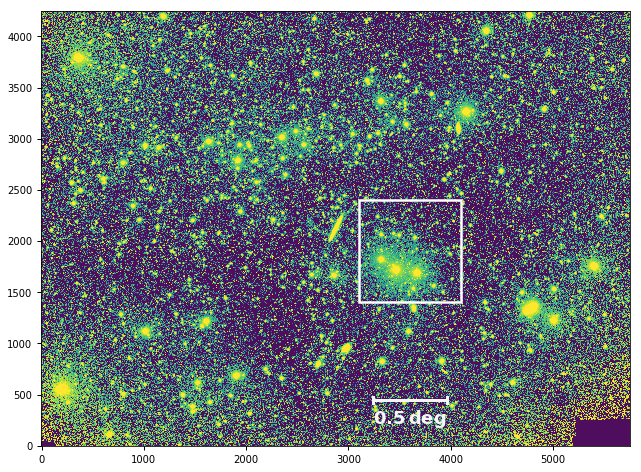

15.0643
14.9938


In [59]:
############################################
# Read
############################################
with fits.open("./data/coadd_SloanG_NGC_5907.fits") as hdul:
    data = hdul[0].data
    header = hdul[0].header
    wcs_data = wcs.WCS(header)
        
# Backgroundlevel and estimated std
mu, ZP = np.float(header["BACKVAL"]), np.float(header["REFZP"])
print("mu: %.2f , ZP: %.2f , pix_scale: %.2f" %(mu, ZP, pixel_scale))

# Crop image
pad = ((patch_Xmax0-patch_Xmin0)-image_size)//2
patch_Xmin, patch_Ymin = patch_Xmin0 + pad, patch_Ymin0 + pad
patch_Xmax, patch_Ymax = patch_Xmax0 - pad, patch_Ymax0 - pad

image_bounds0 = (patch_Xmin0, patch_Ymin0, patch_Xmax0, patch_Ymax0)
patch0, seg_patch0 = crop_image(data, image_bounds0, draw=True)

# Read measurement for faint stars from catalog
# tab_catalog = Table.read("./Measure/NGC5907-G-catalog_PS_X%sY%s.txt"\
#                        %(patch_Xmin0,patch_Ymin0), format="ascii")
tab_catalog = Table.read("./Measure/NGC5907-G-catalog_PS_g_all.txt", format="ascii")
tab_faint = tab_catalog[(tab_catalog["gmag"]>=15) & (tab_catalog["gmag"]<23)]
tab_faint = crop_catalog(tab_faint, keys=("X_IMAGE_PS", "Y_IMAGE_PS"),
                         bounds=(patch_Xmin,patch_Ymin,patch_Xmax,patch_Ymax))
tab_faint["FLUX_AUTO"] = 10**((tab_faint["MAG_AUTO"]-ZP)/(-2.5))
print(tab_faint['gmag'].min())

# Read measurement for bright stars
R_scale = 12
table_res_Rnorm = Table.read("./Measure/NGC5907-G-norm_%dpix_g15mag_X%dY%d.txt"\
                             %(R_scale, patch_Xmin0, patch_Ymin0), format="ascii")
table_res_Rnorm = crop_catalog(table_res_Rnorm, bounds=image_bounds0)
print(table_res_Rnorm['gmag_PS'].max())

Text(0, 0.5, 'Flux from corrected MAG_AUTO')

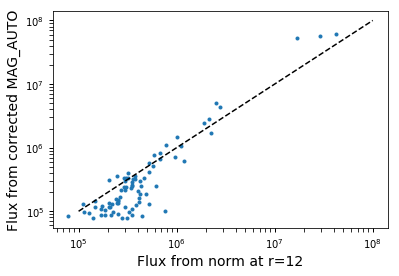

In [81]:
plt.loglog(psf.I2Flux(z_norm+2, r=R_scale), 10**((table_res_Rnorm["MAG_AUTO_corr"]-ZP)/(-2.5)), '.')
x_ls = np.logspace(5,8)
plt.plot(x_ls,x_ls,"k--")
plt.xlabel('Flux from norm at r=%d'%R_scale)
plt.ylabel('Flux from corrected MAG_AUTO')

Threosholds: [28 24] [  98374.98818946 3916378.82013389] [  2.71857685 108.22849365]
# of medium bright (flux:9.9e+04~2.8e+06) stars: 40 
# of very bright (flux>4.4e+06) stars : 5
Not many bright stars, will draw in serial.



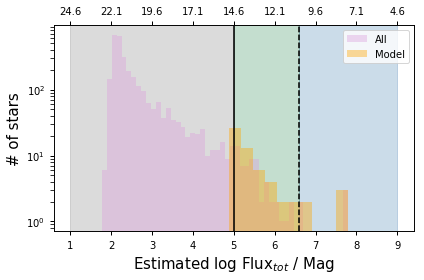

In [83]:
# Star Distribution
############################################
# Positions & Flux of faint stars from SE
ma = tab_faint['FLUX_AUTO'].data.mask
star_pos1 = np.vstack([tab_faint['X_IMAGE_PS'].data[~ma],
                       tab_faint['Y_IMAGE_PS'].data[~ma]]).T - [patch_Xmin, patch_Ymin]
Flux1 = np.array(tab_faint['FLUX_AUTO'].data[~ma])

# Positions & Flux (estimate) of faint stars from measured norm
star_pos2 = np.vstack([table_res_Rnorm['X_IMAGE'],
                       table_res_Rnorm['Y_IMAGE']]).T - [patch_Xmin, patch_Ymin]
Flux2 = 10**((table_res_Rnorm["MAG_AUTO_corr"]-ZP)/(-2.5))

# Estimate of brightness I at r_scale (I = Intensity - BKG) and flux
z_norm = table_res_Rnorm['Imean'].data - mu
z_norm[z_norm<=0] = z_norm[z_norm>0].min()/10
# Flux2 = psf.I2Flux(z_norm, r=R_scale)

# Thresholds
SB_threshold = np.array([28,24])
Flux_threshold = psf.SB2Flux(SB_threshold, BKG=mu, ZP=ZP, r=R_scale)
z_threshold = psf.Flux2I(Flux_threshold, r=R_scale)
print("Threosholds:", SB_threshold, Flux_threshold, z_threshold)

# Combine two samples, make sure they do not overlap
star_pos = np.vstack([star_pos1, star_pos2])
Flux = np.concatenate([Flux1, Flux2])
stars_all = Stars(star_pos, Flux, Flux_threshold=Flux_threshold)
stars_all.plot_flux_dist(label='All', color='plum')

# Bright stars in model
stars0 = Stars(star_pos2, Flux2, Flux_threshold=Flux_threshold,
               z_norm=z_norm, r_scale=R_scale, BKG=mu)
stars0 = stars0.remove_outsider(image_size, d=[24, 6], verbose=True)
stars0.plot_flux_dist(label='Model', color='orange', ZP=ZP)

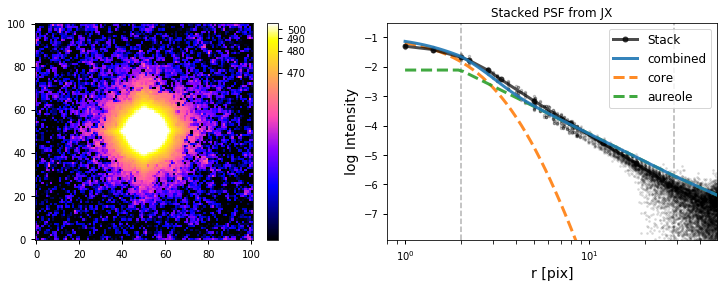

In [7]:
PSF_JX_p = fits.getdata("./median_psf_patch.fits") * 1e5 + mu

fig = plt.figure(figsize=(13,4))
ax1 = plt.subplot(121)
im = ax1.imshow(PSF_JX_p, norm=norm1, vmin=mu); colorbar(im)

ax2 = plt.subplot(122)
r_rbin, z_rbin, logzerr_rbin = cal_profile_1d(abs(PSF_JX_p-mu)/1e6, cen=(50,50), 
                                              ZP=ZP, sky_mean=0, sky_std=1e-6,
                                              dr=1, lw=3, pixel_scale=pixel_scale,
                                              xunit="pix", yunit="Intensity", color="k", label='Stack',
                                              scatter=True, core_undersample=True)
plt.title("Stacked PSF from JX")
psf.plot1D()

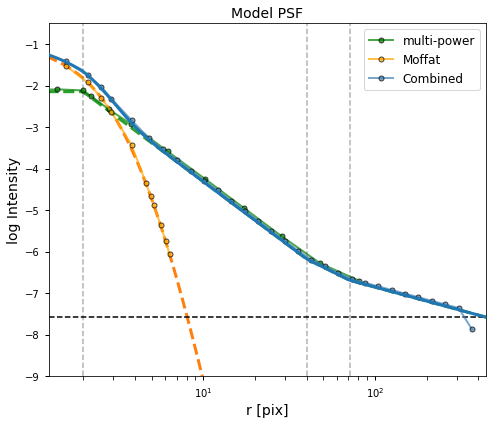

In [63]:
# Generate core and aureole PSF
psf_c = psf.generate_core()
psf_e, psf_size = psf.generate_aureole(contrast=1e6, psf_range=image_size)
star_psf = (1-frac) * psf_c + frac * psf_e

# Galsim 2D model averaged in 1D
Amp_m = psf.Flux2Amp(Flux).max()
sigma = 2
psf.plot_model_galsim(contrast=Amp_m/sigma)

In [84]:
# Setup Image
############################################
# Make noise image
noise_image = make_noise_image(image_size, sigma)

# Make sky background and dim stars
image_base = make_base_image(image_size, stars_all, psf_base=star_psf, psf_size=64, pad=pad, verbose=True)

# Cutout of data
image0 = patch0.copy()
image = image0[pad:-pad,pad:-pad]

Generate noise background w/ stddev = 2
Generate base image of faint stars (flux < 9.8e+04).
Total Time: 2.443 s



Detect and deblend source... Mask S/N > 3.0 (5th enlarged)
Use mask map built from catalog
Mask core regions: r < 36 (24) pix 
Use sky strips crossing very bright stars


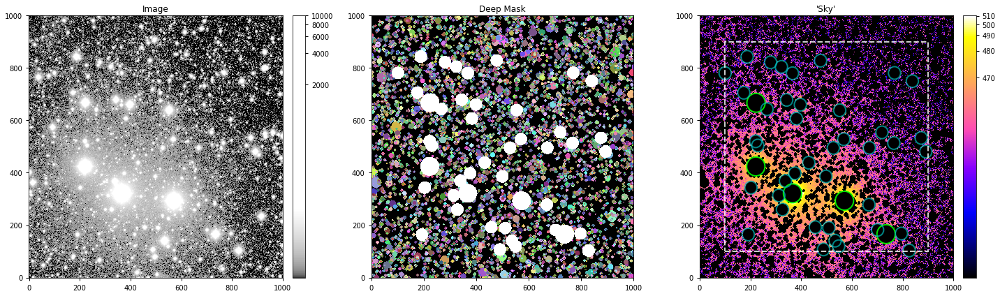

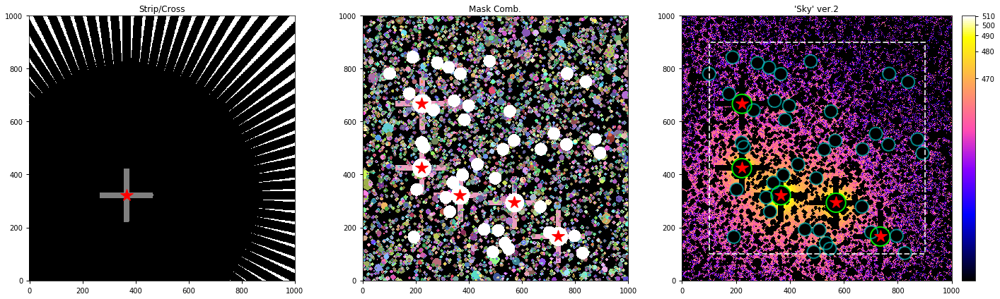

In [85]:
# Make Mask
############################################
mask = Mask(image0, stars0, image_size, pad=pad, mu=mu)

# Core mask
r_core_s = [36, 24]
r_out_s = None

mask_base = "./Measure/Seg_PS_X%dY%d.fits" %(patch_Xmin0, patch_Ymin0)
mask.make_mask_map_dual(r_core_s, r_out=r_out_s, mask_base=mask_base,
                        sn_thre=3, draw=True, n_dilation=5)

# Strip + Cross mask
mask.make_mask_strip(wid_strip, n_strip, dist_strip=1000, clean=True,draw=True)
stars_b = mask.stars_new

In [86]:
# Choose if only use brightest stars
brightest_only = True

if brightest_only:
    stars_vb = Stars(stars_b.star_pos_verybright,
                     stars_b.Flux_verybright,
                     Flux_threshold=stars_b.Flux_threshold,
                     z_norm=stars_b.z_norm_verybright, BKG=stars_b.BKG, r_scale=R_scale)
    stars = stars_vb
else:
    stars = stars_b
    
z_norm_stars = stars.z_norm.copy()
stars_tri = stars.copy()

In [182]:
# Estimates
############################################
mask_fit = mask.mask_comb if mask_strip else mask.mask_deep
    
Y = image[~mask_fit].copy().ravel()

# Estimated mu and sigma used as prior
Y_clip = sigma_clip(image[~mask.mask_deep], sigma=3, maxiters=10)
mu_patch, std_patch = np.mean(Y_clip), np.std(Y_clip)
print("Estimate of Background: (%.3f, %.3f)"%(mu_patch, std_patch))

# Poisson Noise
n_frame = np.int(header['NFRAMES'])
std_poi = np.median(np.sqrt(Y/0.37/n_frame))
print("Poisson Noise: %.3f"%std_poi)

Estimate of Background: (462.658, 3.204)
Poisson Noise: 1.422


#### Test


Total Time: 0.544s


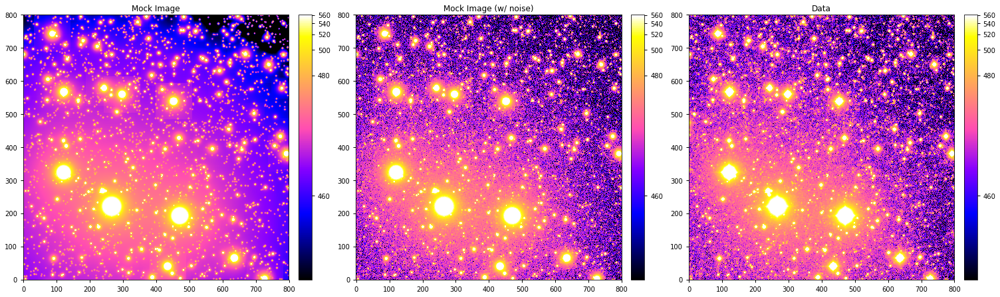

In [88]:
## Generate Image Test
############################################
start = time.time()
image_tri0 = generate_image_by_znorm(psf, stars_b, psf_scale=pixel_scale, parallel=False, draw_real=True)
image_tri0 = image_tri0 + image_base + mu -2
end = time.time()
print("\nTotal Time: %.3fs"%(end-start))
    
# Draw
if draw:
    fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(21,7))
    im = ax1.imshow(image_tri0, vmin=mu-1, vmax=mu+100, norm=norm1, cmap="gnuplot2")
    ax1.set_title("Mock Image"); colorbar(im)
    im = ax2.imshow(image_tri0 + noise_image, vmin=mu-1, vmax=mu+100, norm=norm1, cmap="gnuplot2")    
    ax2.set_title("Mock Image (w/ noise)"); colorbar(im)
    im = ax3.imshow(image, vmin=mu-1, vmax=mu+100, norm=norm1, cmap="gnuplot2")
    ax3.set_title("Data"); colorbar(im)
    plt.tight_layout()  

In [19]:
%%timeit
image_tri0 = generate_image_by_znorm(psf, stars, psf_range=[320,640],
                                     psf_scale=pixel_scale, parallel=False, draw_real=True)

173 ms ± 26.2 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [80]:
%%timeit
psf.update({'n_s':[3.3, 2.8], 'theta_s':[theta_0, 60]})
image_tri0 = generate_image_by_znorm(psf, stars, psf_range=[120,300], brightest_only=False,
                                        psf_scale=pixel_scale, parallel=True, draw_real=False)

157 ms ± 1.21 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


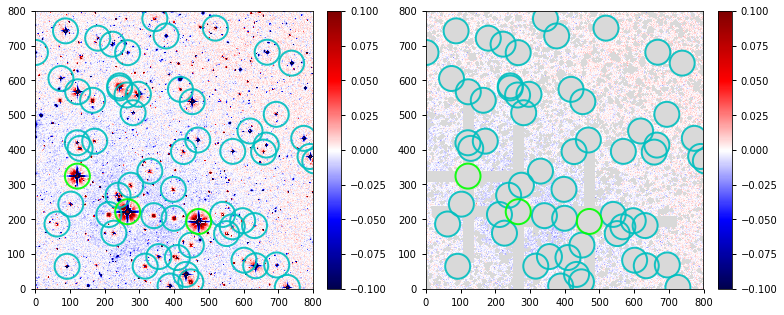

In [20]:
img_diff = (image_tri0-image)/image
plt.figure(figsize=(11,5))
ax1=plt.subplot(121)
im = plt.imshow(img_diff, vmin=-0.1, vmax=0.1, origin="lower", cmap="seismic")
colorbar(im)

ax2=plt.subplot(122)
img_diff[mask.mask_comb] = np.nan
im = plt.imshow(img_diff, vmin=-0.1, vmax=0.1, origin="lower", cmap="seismic")
colorbar(im)

aper1 = CircularAperture(stars_b.star_pos_medbright, r=36)
aper2 = CircularAperture(stars_b.star_pos_verybright, r=36)
for ax in [ax1,ax2]:
    aper1.plot(color='c',lw=2,alpha=0.9,axes=ax)
    aper2.plot(color='lime',lw=2,alpha=0.9,axes=ax)

plt.tight_layout()

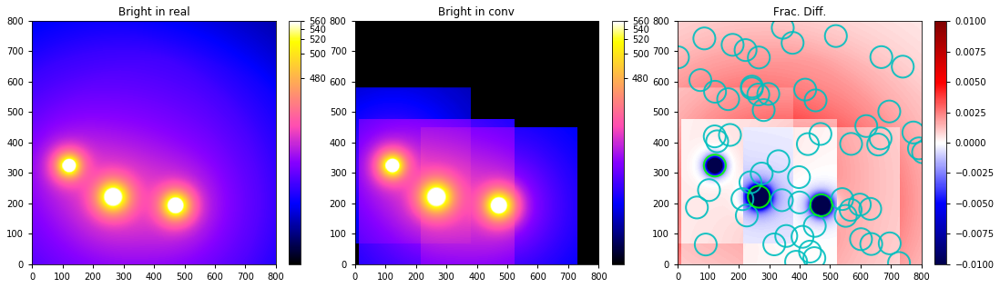

In [21]:
# Difference between real vs conv
psf.update({'n_s':n_s})

img1 = generate_image_by_znorm(psf, stars, psf_range=[320,640], psf_scale=pixel_scale, draw_real=True)
img2 = generate_image_by_znorm(psf, stars, psf_range=[320,640], psf_scale=pixel_scale, draw_real=False)

fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(18,6))
im = ax1.imshow(img1+mu, vmin=mu, vmax=mu+100, norm=norm1, cmap="gnuplot2")
ax1.set_title("Bright in real"); colorbar(im)
im = ax2.imshow(img2+mu, vmin=mu, vmax=mu+100, norm=norm1, cmap="gnuplot2")    
ax2.set_title("Bright in conv"); colorbar(im)
im = ax3.imshow((img1-img2)/mu, vmin=-0.01, vmax=0.01, cmap="seismic")
ax3.set_title("Frac. Diff."); colorbar(im)

aper1.plot(color='c',lw=2,alpha=0.9,axes=ax3)
aper2.plot(color='lime',lw=2,alpha=0.9,axes=ax3)

### Multi-Power Law

In [174]:
# Priors and Likelihood Models for Fitting
############################################
labels = [r'$n0$', r'$n1$', r'$\theta_1$', r'$\mu$', r'$\log\,\sigma$']
ndim = len(labels)

# Make Priors
prior_tf_2p = set_prior(n_est=3.1, mu_est=mu_patch, std_est=std_patch,
                        n_min=0.8, theta_in=60, theta_out=300, method='2p')

def loglike_2p(v):
    _n_s = np.append(v[:2], 4)
    _theta_s = np.append([theta_0, 10**v[2]], 1200)
    _mu, _sigma = v[-2], 10**v[-1]
    
    psf.update({'n_s':_n_s, 'theta_s':_theta_s})
     
    # I varies with sky background (true sky background is lower)
    stars_tri.z_norm = z_norm_stars + (stars.BKG - _mu)
    
    image_tri = generate_image_by_znorm(psf, stars_tri, psf_range=[320,640], brightest_only=True,
                                        psf_scale=pixel_scale, parallel=False, draw_real=True)
    image_tri = image_tri + image_base + _mu
    
    ypred = image_tri[~mask_fit].ravel()
    residsq = (ypred - Y)**2 / _sigma**2
    loglike = -0.5 * np.sum(residsq + math.log(2 * np.pi * _sigma**2))
#     Var = Y / 0.37 / n_frame + _sigma**2
#     residsq = (ypred - Y)**2 / Var
#     loglike = -0.5 * np.sum(residsq + np.log(2 * np.pi * Var))
    
    if not np.isfinite(loglike):
        loglike = -1e100
        
    return loglike

In [12]:
labels = [r'$n0$', r'$n1$', r'$\theta_1$', r'$\log\,A_{01}}$', r'$\log\,A_{10}}$', r'$\mu$', r'$\log\,\sigma$']
ndim = len(labels)

prior_tf_2pleg = set_prior(n_est=3.1, mu_est=mu_patch, std_est=std_patch, leg2d=True,
                        n_min=0.5, theta_in=60, theta_out=600, method='2p')

loglike_2pleg = set_likelihood(Y, mask_fit, psf, stars, method='2p', leg2d=True,
                               draw_func=generate_image_by_znorm, psf_range=[320,640],
                               image_base=image_base, z_norm_stars=z_norm_stars, 
                               brightest_only=True, parallel=False, draw_real=True)

ds_2pleg = DynamicNestedSampler(loglike_2pleg, prior_tf_2pleg, ndim)
ds_2pleg.run_fitting(nlive_init=50, nlive_batch=15, maxbatch=2)


Opening new pool: # of CPU used: 3
Run Nested Fitting for the image... Dim of params: 7


iter: 1950 | batch: 2 | bound: 133 | nc: 10 | ncall: 10996 | eff(%): 17.734 | loglstar: -611862.282 < -611856.815 < -611858.181 | logz: -611888.262 +/-    nan | stop:  5.232                         


Finish Fitting! Total time elapsed: 2.61e+03 s

Pool Closed.


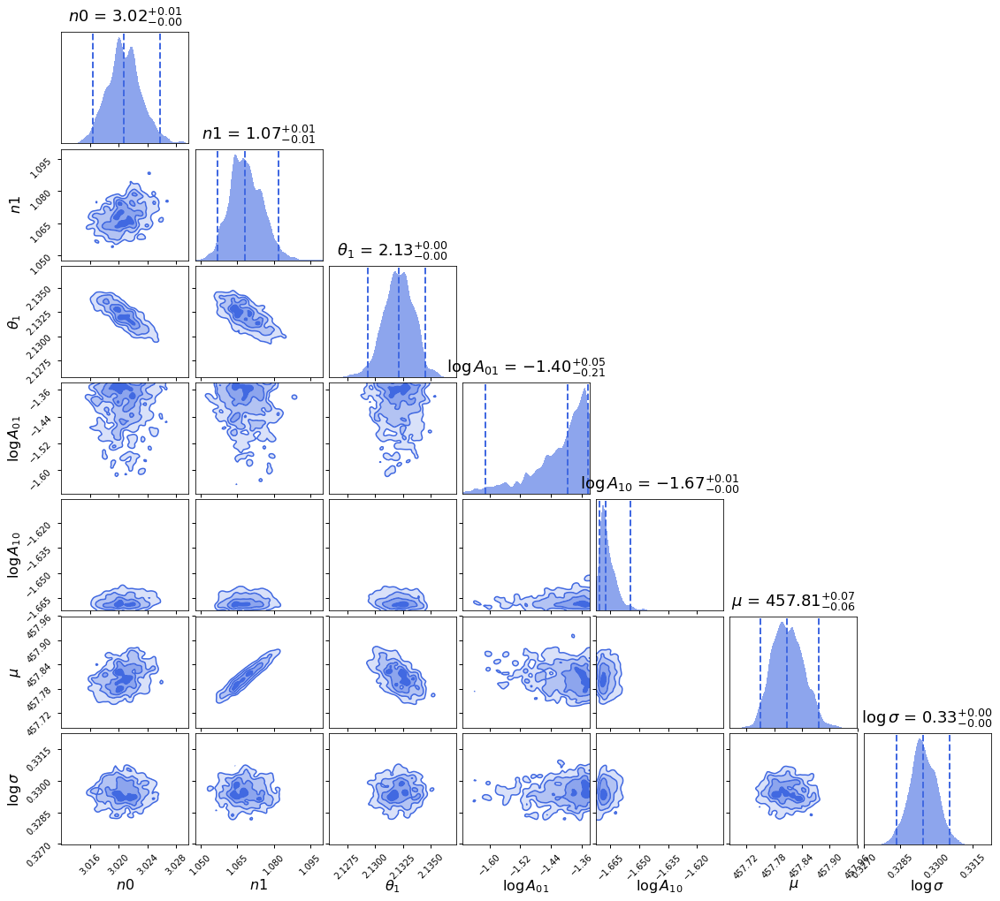

In [58]:
ds_2pleg.cornerplot(labels=labels, figsize=(16, 14))

[3.02066941 1.06804866 3.        ] [   5.          135.56086511 1200.        ]
Bakground : 457.81 +/- 2.14
Reduced Chi^2: 1.10360


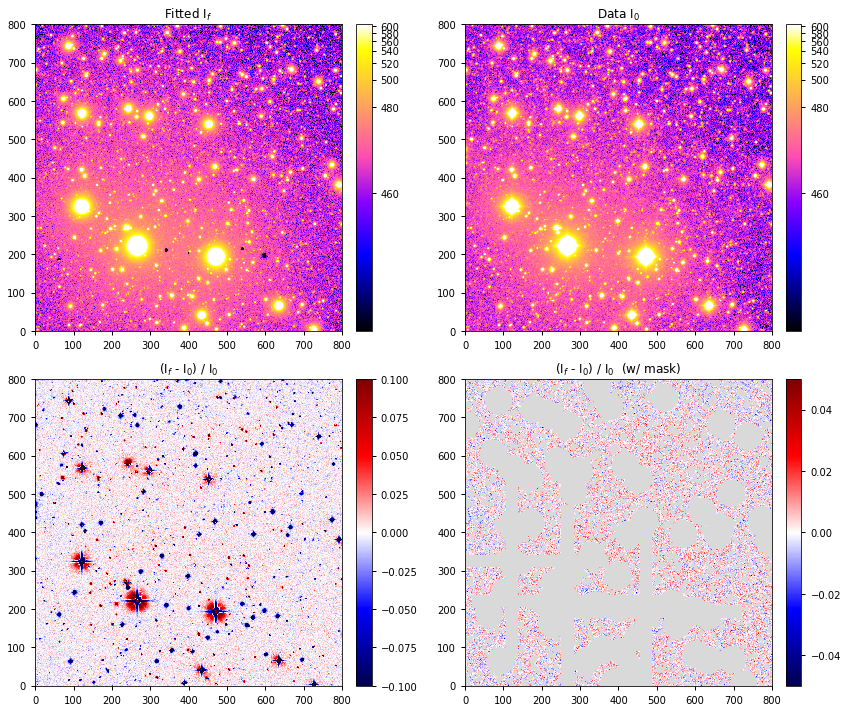

In [76]:
psf_fit = make_psf_from_fit(ds_2pleg.results, n_out=3, theta_out=1200, leg2d=True)
image_fit, noise_fit, bkg_fit = generate_image_fit(psf_fit, stars0, image_base)
cal_reduced_chi2((image_fit[~mask_fit]).ravel(), Y, pmed)
draw_comparison_fit_data(image_fit, image, noise_fit, mask_fit, vmin=457)

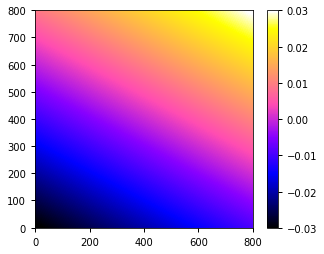

In [73]:
im=plt.imshow(bkg_fit, vmin=-0.03, vmax=+0.03)
colorbar(im)

In [14]:
# Run & Plot
############################################
ds_2p = DynamicNestedSampler(loglike_2p, prior_tf_2p, ndim)
ds_2p.run_fitting(nlive_init=50, nlive_batch=15, maxbatch=2)


Opening new pool: # of CPU used: 3
Run Nested Fitting for the image... Dim of params: 5


iter: 1487 | batch: 2 | bound: 56 | nc: 4 | ncall: 5382 | eff(%): 27.629 | loglstar: -867365.989 < -867361.541 < -867362.504 | logz: -867384.915 +/-  0.917 | stop:  6.188                            


Finish Fitting! Total time elapsed: 876 s

Pool Closed.


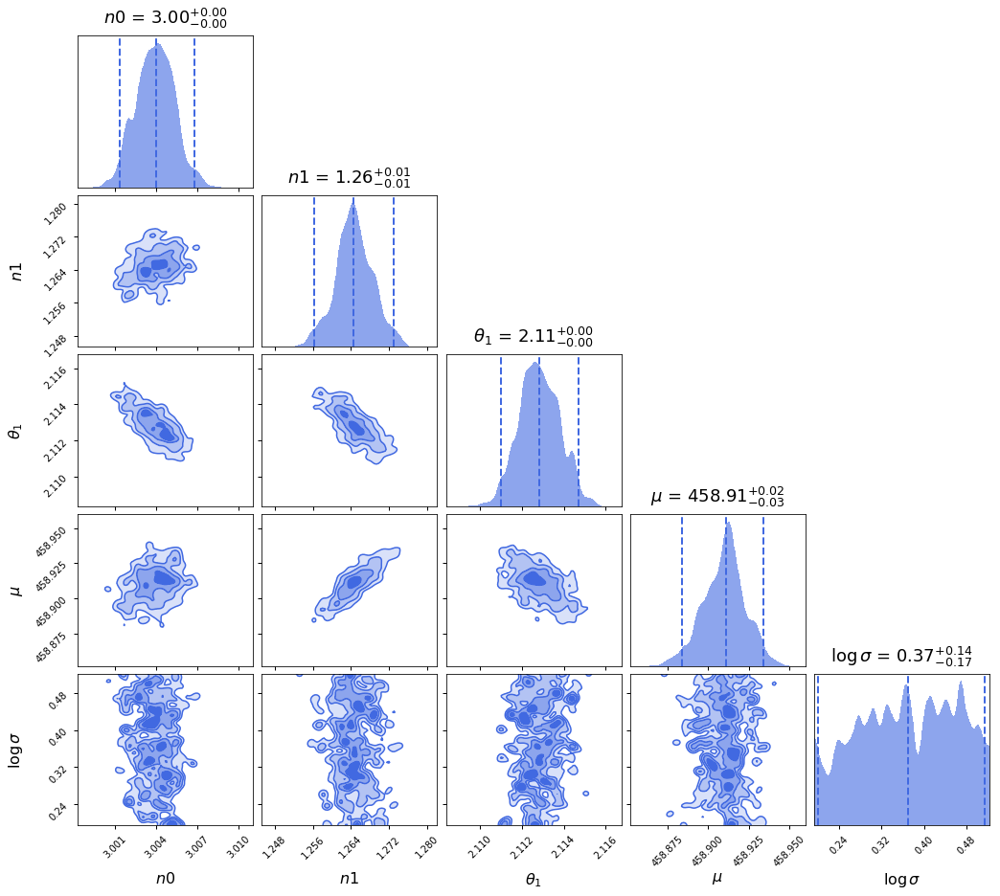

In [16]:
ds_2p.cornerplot(labels=labels, figsize=(15, 13))

Bakground : 458.91 +/- 2.34
Reduced Chi^2: 0.96032


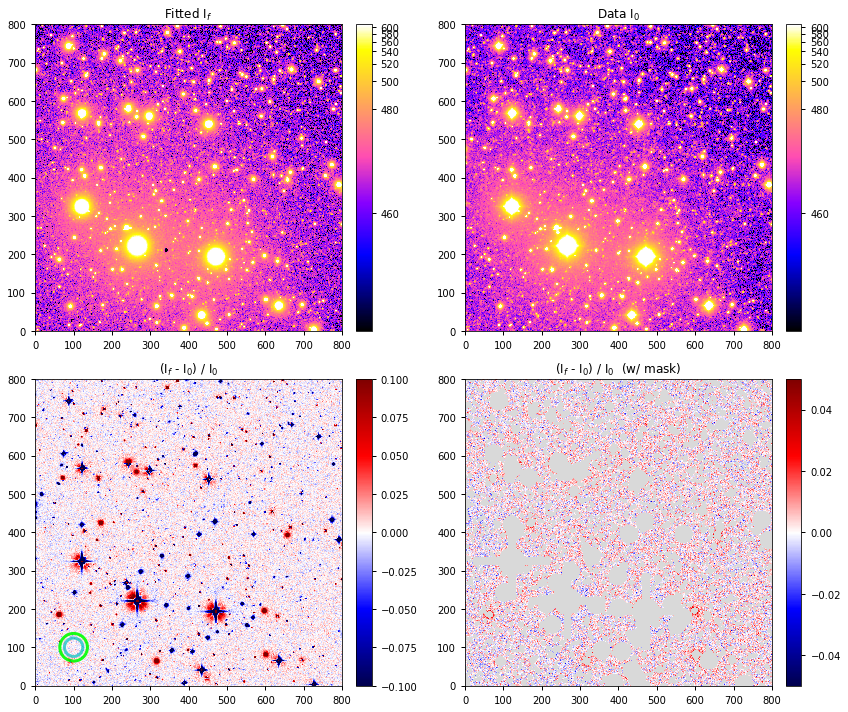

In [17]:
psf_fit, params = make_psf_from_fit(ds_2p.results, psf, n_out=3, theta_out=1200, leg2d=False)
image_fit, noise_fit, bkg_fit = generate_image_fit(psf_fit, stars0, image_base)

cal_reduced_chi2((image_fit[~mask_fit]).ravel(), Y, params)
draw_comparison_2D(image_fit, image, mask_fit, noise_fit, r_core=[36,24], vmin=458)

In [20]:
# Run & Plot
############################################
ds_2p = DynamicNestedSampler(loglike_2p, prior_tf_2p, ndim)
ds_2p.run_fitting(nlive_init=50, nlive_batch=15, maxbatch=2)


Opening new pool: # of CPU used: 3
Run Nested Fitting for the image... Dim of params: 5


iter: 1422 | batch: 2 | bound: 65 | nc: 2 | ncall: 6134 | eff(%): 23.182 | loglstar: -665435.089 < -665431.642 < -665432.887 | logz: -665454.228 +/-  0.905 | stop:  6.170                            


Finish Fitting! Total time elapsed: 1.01e+03 s

Pool Closed.


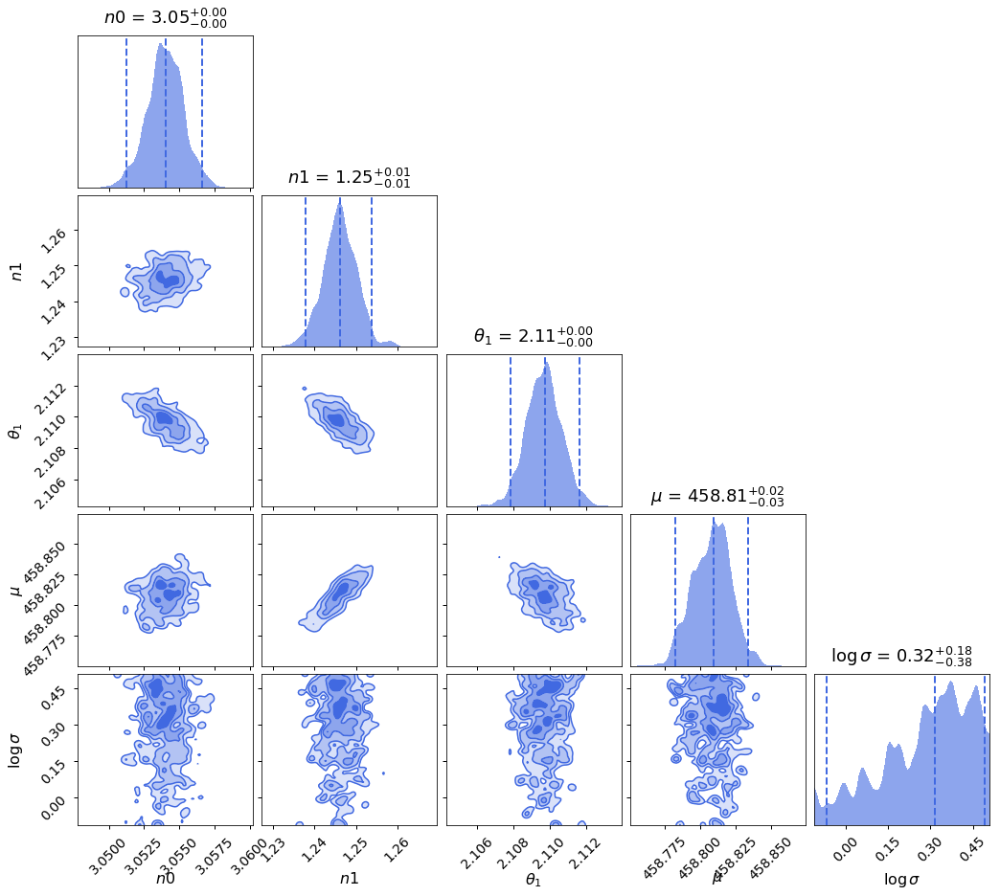

In [21]:
ds_2p.cornerplot(labels=labels, figsize=(15, 13))

Fitting (mean) :  [3.05400e+00 1.24600e+00 2.11000e+00 4.58808e+02 2.83000e-01]
Fitting (median) :  [3.05400e+00 1.24600e+00 2.11000e+00 4.58809e+02 3.14000e-01]


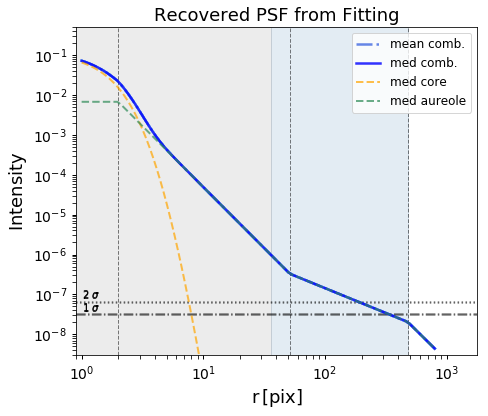

In [25]:
plot_fit_PSF1D(ds_2p.results, psf, n_bootstrap=500, Amp_max=Amp_m, r_core=r_core_s)

Bakground : 458.81 +/- 2.08
Reduced Chi^2: 1.16485


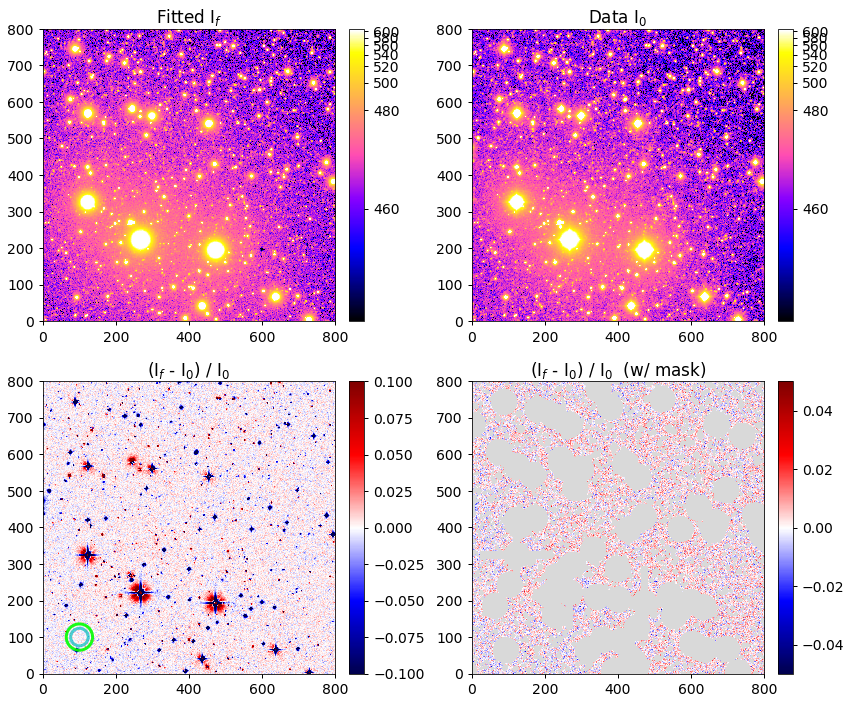

In [61]:
psf_fit, params = make_psf_from_fit(ds_2p.res, psf, n_out=3, theta_out=1200, leg2d=False)
image_fit, noise_fit, bkg_fit = generate_image_fit(psf_fit, stars0, image_base)

cal_reduced_chi2((image_fit[~mask_fit]).ravel(), Y, params)
draw_comparison_2D(image_fit, image, mask_fit, noise_fit, r_core=[36,24], vmin=458)

In [18]:
# Run & Plot
############################################
ds_2p = DynamicNestedSampler(loglike_2p, prior_tf_2p, ndim)
ds_2p.run_fitting(nlive_init=50, nlive_batch=10, maxbatch=2)


Opening new pool: # of CPU used: 3
Run Nested Fitting for the image... Dim of params: 5


iter: 2370 | batch: 2 | bound: 69 | nc: 2 | ncall: 6899 | eff(%): 34.353 | loglstar: -696176.646 < -696171.726 < -696173.287 | logz: -696211.665 +/-  1.215 | stop:  6.160                            


Finish Fitting! Total time elapsed: 1.06e+03 s

Pool Closed.


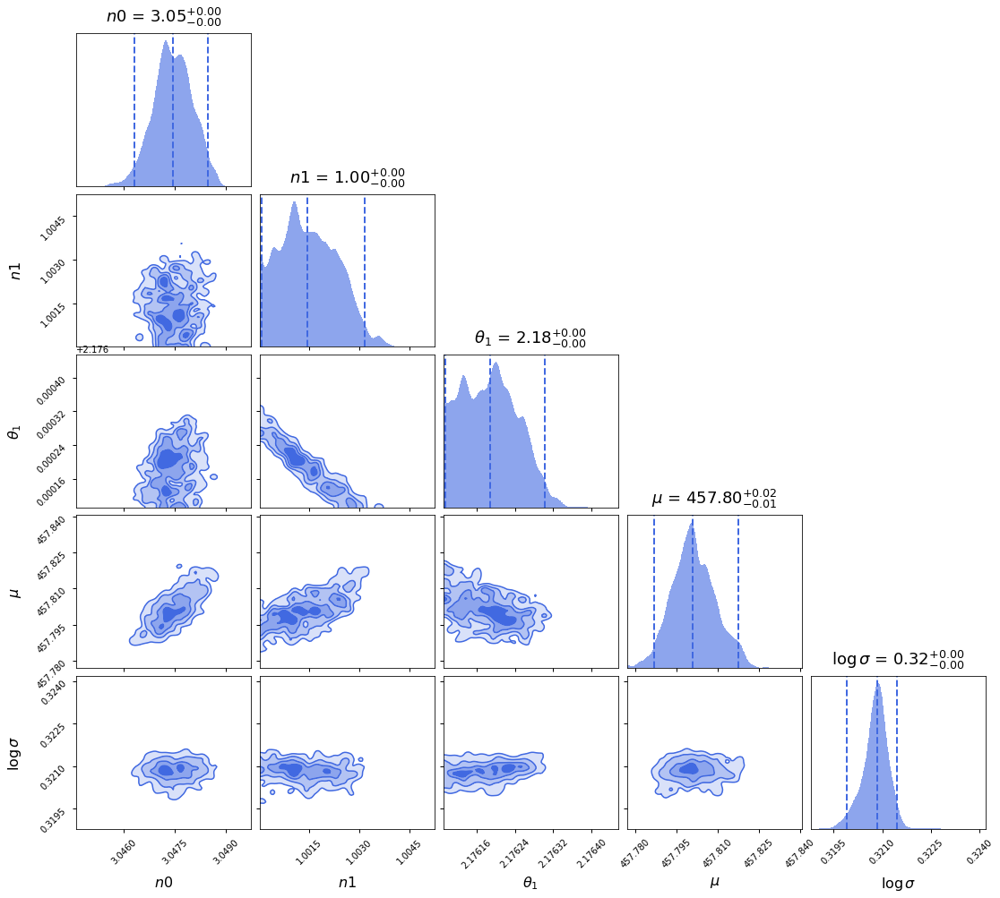

In [19]:
ds_2p.cornerplot(labels=labels, figsize=(16, 14))

Fitting (mean) :  [3.04700e+00 1.00100e+00 2.17600e+00 4.57801e+02 3.21000e-01]
Fitting (median) :  [3.04700e+00 1.00100e+00 2.17600e+00 4.57801e+02 3.21000e-01]


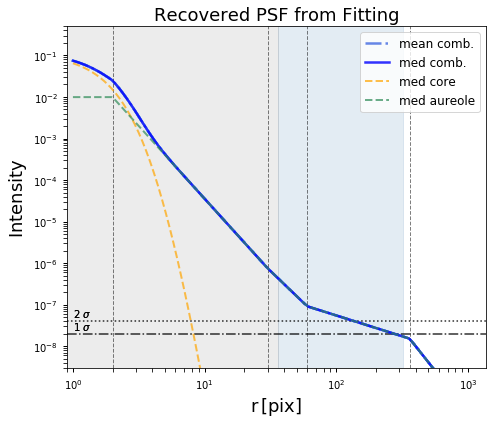

In [20]:
plot_fit_PSF(ds_2p.results, psf, n_bootstrap=1000, Amp_max=Amp_m, r_core=r_core_s)

Bakground : 457.80 +/- 2.09
Reduced Chi^2: 1.08394


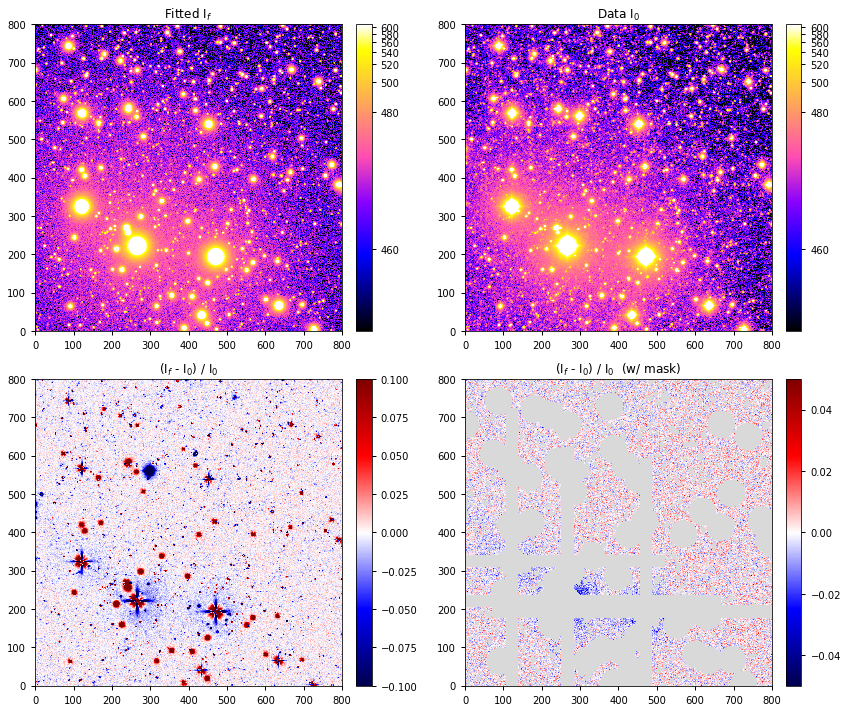

In [23]:
image_fit, noise_fit, pmed = generate_image_fit(ds_2p.results, psf, stars0, image_base)
cal_reduced_chi2((image_fit[~mask_fit]+2).ravel(), Y, sigma=10**pmed[-1], n_param=5)
draw_comparison_fit_data(image_fit+2, image, noise_fit, mask_fit, vmin=mu-1)

In [31]:
# Run & Plot
############################################
ds_2p = DynamicNestedSampler(loglike_2p, prior_tf_2p, ndim)
ds_2p.run_fitting(nlive_init=60, nlive_batch=20, maxbatch=2)


Opening new pool: # of CPU used: 3
Run Nested Fitting for the image... Dim of params: 5


iter: 2055 | batch: 2 | bound: 69 | nc: 2 | ncall: 7870 | eff(%): 26.112 | loglstar: -670280.329 < -670276.379 < -670277.580 | logz: -670304.351 +/-  0.928 | stop:  5.975                            


Finish Fitting! Total time elapsed: 1.25e+03 s

Pool Closed.


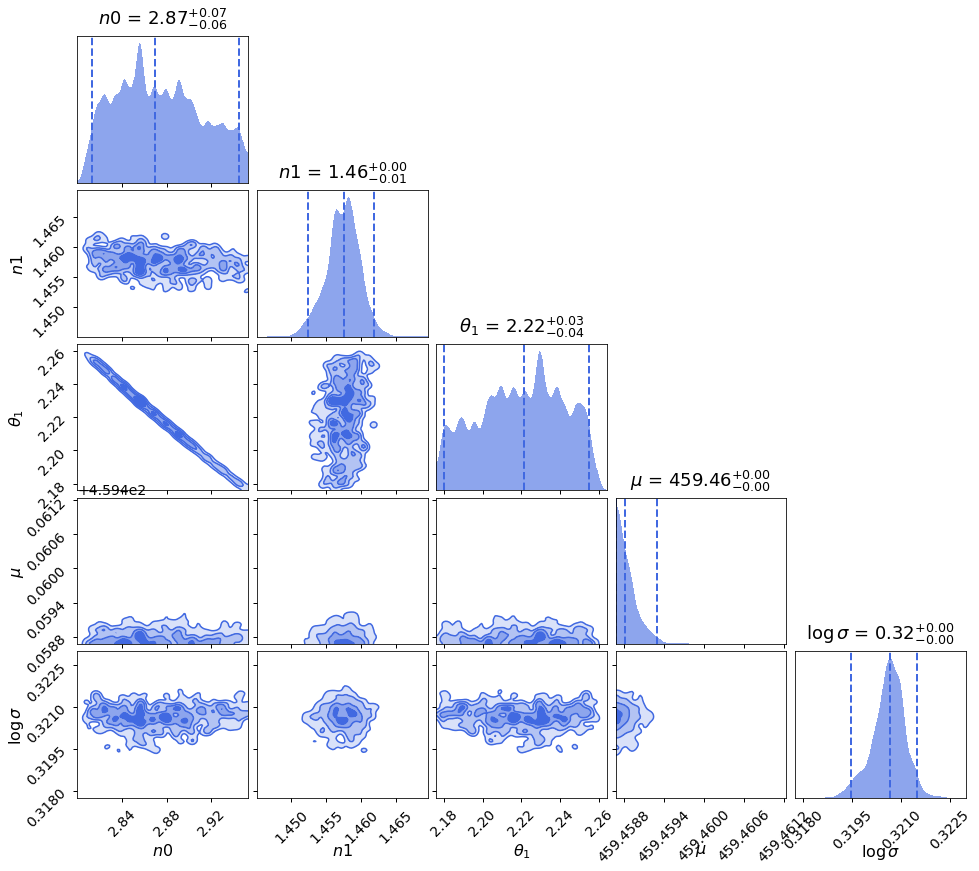

In [32]:
ds_2p.cornerplot(labels=labels, figsize=(16, 14))

Fitting (mean) :  [2.87400e+00 1.45700e+00 2.22000e+00 4.59459e+02 3.21000e-01]
Fitting (median) :  [2.87000e+00 1.45800e+00 2.22100e+00 4.59459e+02 3.21000e-01]


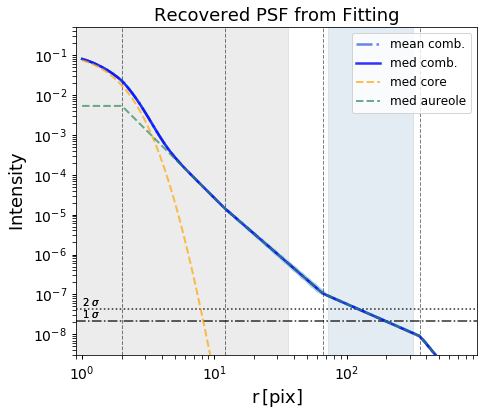

In [34]:
plot_fit_PSF(ds_2p.results, psf, n_bootstrap=1000, Amp_max=Amp_m, r_core=r_core_s)

Bakground : 459.46 +/- 2.09
Reduced Chi^2: 0.95893


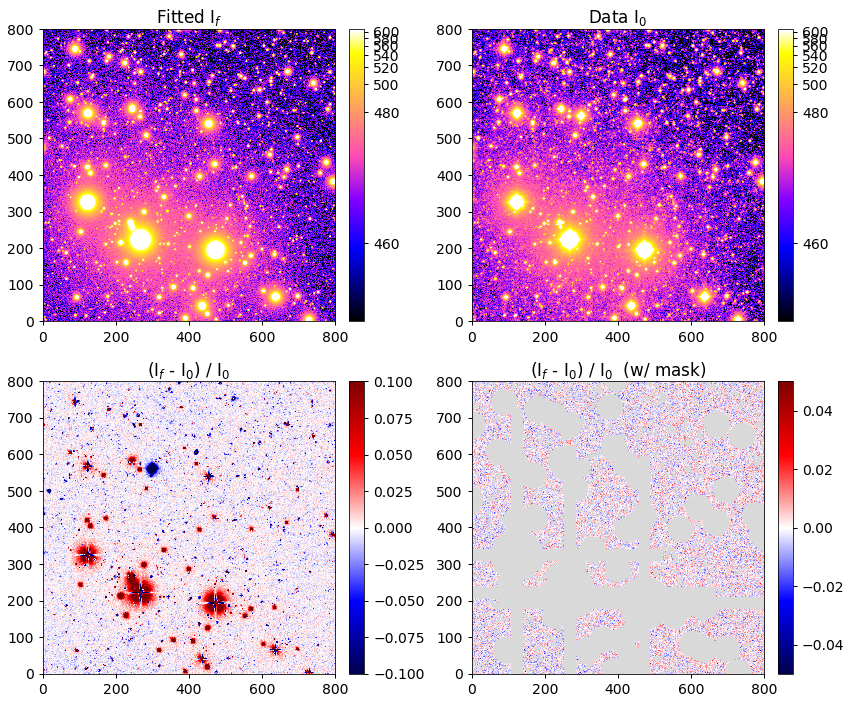

In [43]:
image_fit, noise_fit, pmed = generate_image_fit(ds_2p.results, psf, stars0, image_base)
cal_reduced_chi2(image_fit[~mask_fit].ravel(), Y, sigma=10**pmed[-1], n_param=3)
draw_comparison_fit_data(image_fit, image, noise_fit, mask_fit, vmin=mu-1)

In [90]:
# Priors and Likelihood Models for Fitting
############################################
labels = [r'$n0$', r'$n1$', r'$n2$', r'$\theta_1$', r'$\theta_2$', r'$\mu$', r'$\log\,\sigma$']
ndim = len(labels)

# Make Priors
prior_tf_3p = set_prior(n_est=3.1, mu_est=mu_patch, std_est=std_patch,
                        n_min=0.8, theta_in=60, theta_out=300, method='3p')

def loglike_3p(v):
    _n_s = np.append(v[:3], 4)
    _theta_s = np.append([theta_0, 10**v[3], 10**v[4]], 1200)
    _mu, _sigma = v[-2], 10**v[-1]
    
    psf.update({'n_s':_n_s, 'theta_s':_theta_s})
     
    # I varies with sky background
    stars_tri.z_norm = z_norm_stars + (stars.BKG - _mu)
    
    image_tri = generate_image_by_znorm(psf, stars_tri, psf_range=[320,640], brightest_only=True,
                                        psf_scale=pixel_scale, parallel=False, draw_real=True)
    image_tri = image_tri + image_base + _mu
    
    ypred = image_tri[~mask_fit].ravel()
    residsq = (ypred - Y)**2 / _sigma**2
    loglike = -0.5 * np.sum(residsq + np.log(2 * np.pi * _sigma**2))
    
    if not np.isfinite(loglike):
        loglike = -1e100
        
    return loglike

Possion Noise ($\sqrt{S / G}$) + Guassian Noise: $\sigma$=3


Opening new pool: # of CPU used: 3
Run Nested Fitting for the image... Dim of params: 7


iter: 1444 | batch: 2 | bound: 49 | nc: 6 | ncall: 6763 | eff(%): 21.351 | loglstar: -1157045.665 <   -inf < -1157043.970 | logz:   -inf +/-  0.612 | stop:  5.983                                    



Finish Fitting! Total time elapsed: 1.15e+03 s

Pool Closed.


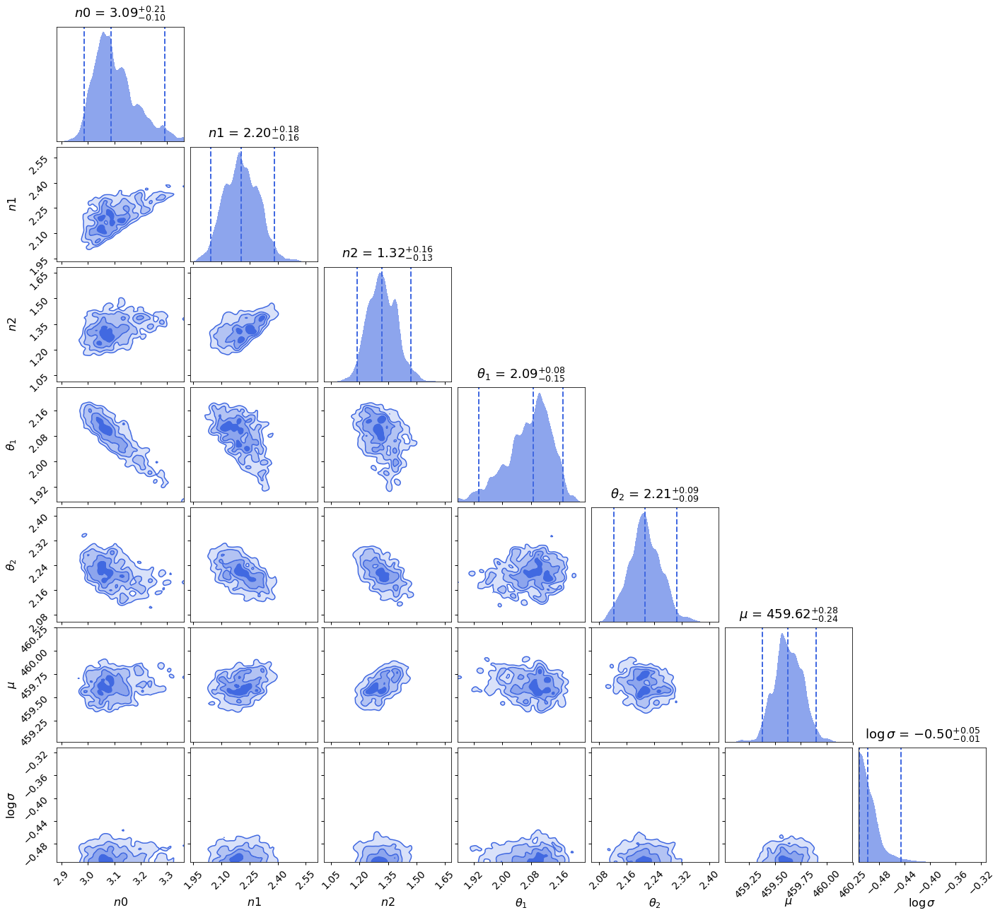

In [104]:
# Run & Plot
############################################
ds_3p = DynamicNestedSampler(loglike_3pn, prior_tf_3p, ndim)
ds_3p.run_fitting(nlive_init=70, nlive_batch=15, maxbatch=2)

ds_3p.cornerplot(labels=labels, figsize=(20, 18))

In [111]:
save_nested_fitting_result(ds_3p.results, filename='./real/NGC5907-G-fit_best_X%dY%d_mask48pix_3PN.res'%(patch_Xmin0, patch_Ymin0))
ds_3p_res = open_nested_fitting_result('./real/NGC5907-G-fit_best_X%dY%d_mask48pix_3PN.res'%(patch_Xmin0, patch_Ymin0))

Fitting (mean) :  [  3.103   2.208   1.32    2.076   2.214 459.631  -0.493]
Fitting (median) :  [  3.088   2.204   1.316   2.086   2.212 459.626  -0.498]


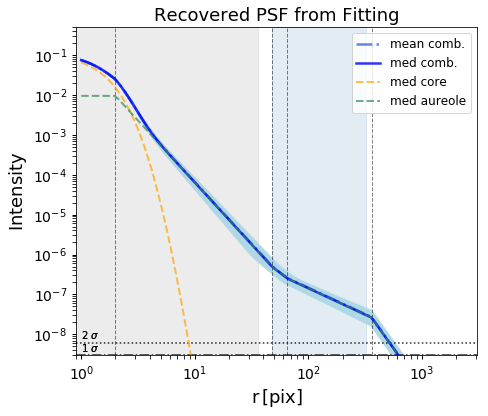

In [112]:
plot_fit_PSF(ds_3p_res, psf, n_bootstrap=1000, Amp_max=Amp_m, r_core=r_core_s)

Bakground : 459.62 +/- 0.32
Reduced Chi^2: 0.00355


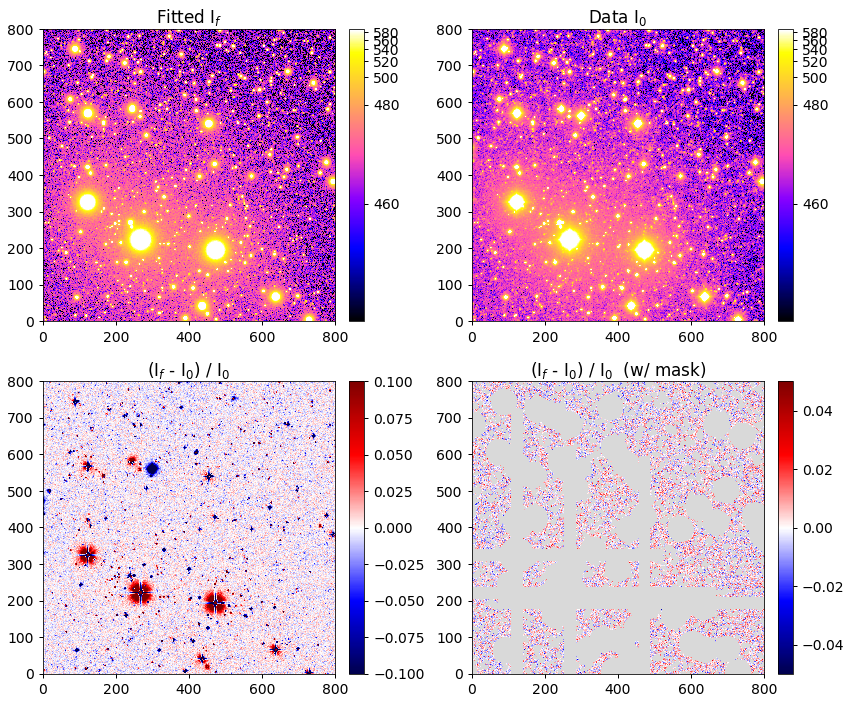

In [114]:
image_fit, noise_fit, pmed = generate_image_fit(ds_3p_res, psf, stars0, image_base)
cal_reduced_chi2(image_fit[~mask_fit].ravel(), Y, pmed, sky_only=False, n_param=7)
draw_comparison_fit_data(image_fit, image, noise_fit*10, mask_fit, vmin=458, vmax=590)

Guassian Noise: $\sigma$ = 3


Opening new pool: # of CPU used: 3
Run Nested Fitting for the image... Dim of params: 7


iter: 2566 | batch: 2 | bound: 175 | nc: 4 | ncall: 20483 | eff(%): 12.527 | loglstar: -1002025.164 <   -inf < -1002022.581 | logz:   -inf +/-  0.906 | stop:  5.647                                  



Finish Fitting! Total time elapsed: 5.2e+03 s

Pool Closed.


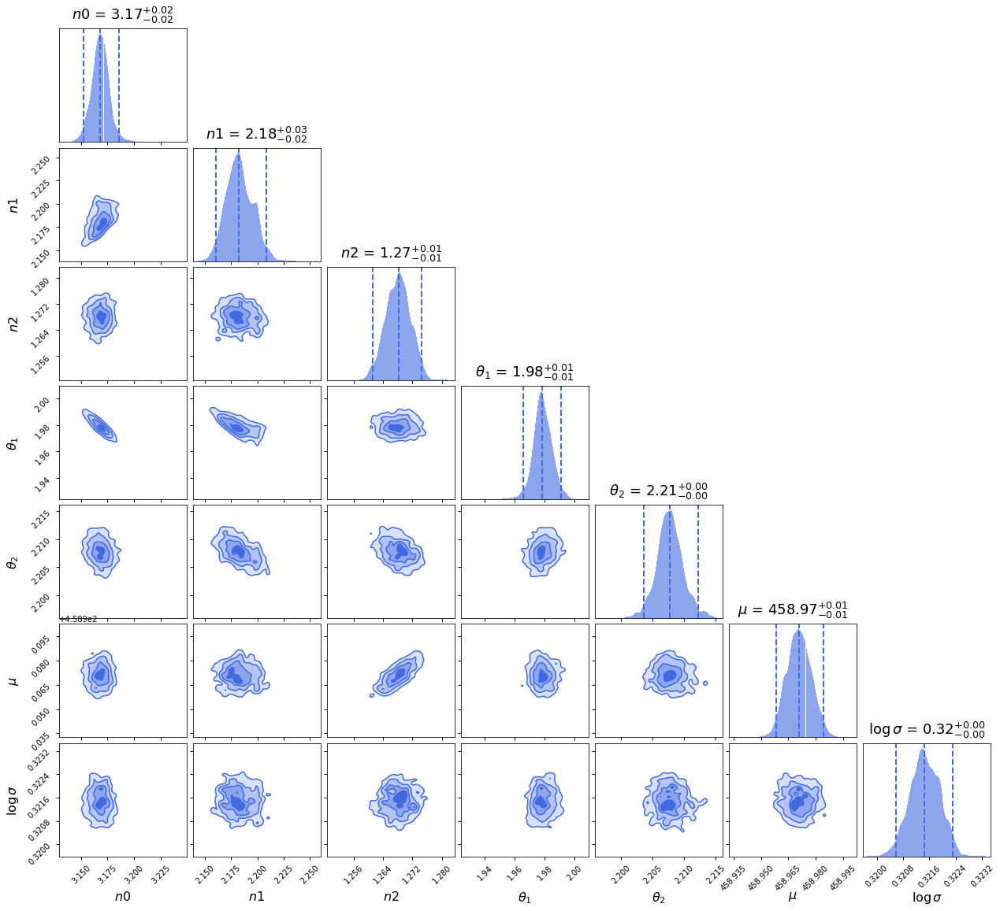

In [16]:
# Run & Plot
############################################
ds_3p = DynamicNestedSampler(loglike_3p, prior_tf_3p, ndim)
ds_3p.run_fitting(nlive_init=70, nlive_batch=15, maxbatch=2)

ds_3p.cornerplot(labels=labels, figsize=(18, 16)) 

Fitting (mean) :  [3.16800e+00 2.18300e+00 1.26800e+00 1.97900e+00 2.20800e+00 4.58971e+02
 3.21000e-01]
Fitting (median) :  [3.16800e+00 2.18200e+00 1.26800e+00 1.97800e+00 2.20800e+00 4.58971e+02
 3.21000e-01]


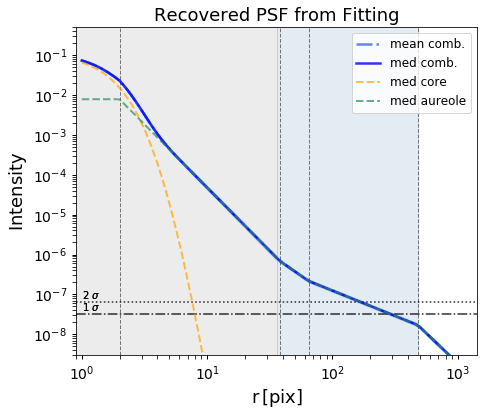

In [19]:
plot_fit_PSF(ds_3p.results, psf, n_bootstrap=1000, Amp_max=Amp_m, r_core=r_core_s)

Bakground : 458.97 +/- 2.10
Reduced Chi^2: 1.07291


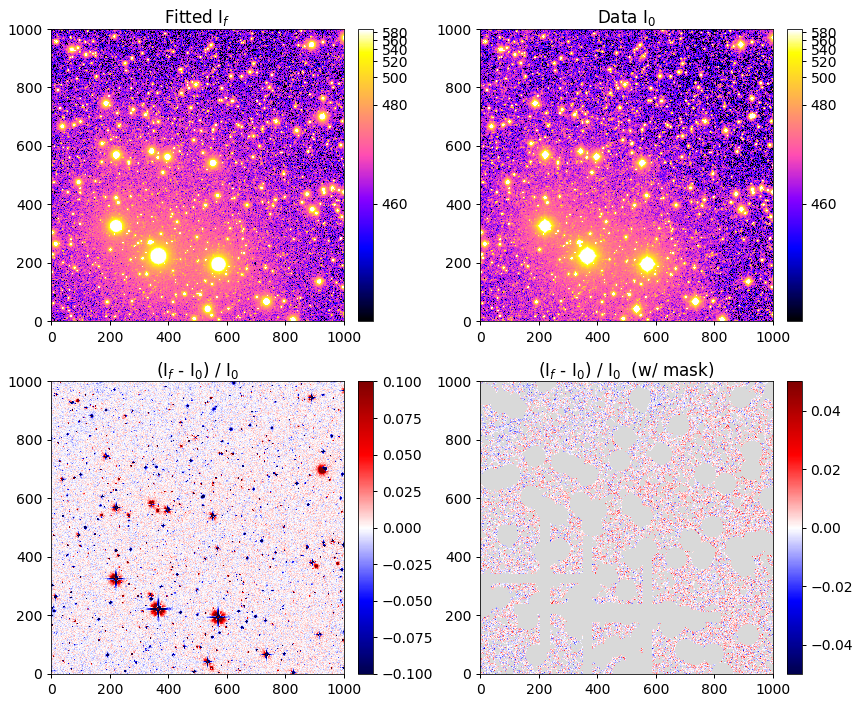

In [20]:
image_fit, noise_fit, pmed = generate_image_fit(ds_3p.results, psf, stars0, image_base)
cal_reduced_chi2(image_fit[~mask_fit].ravel(), Y, pmed, sky_only=True, n_param=7)
draw_comparison_fit_data(image_fit, image, noise_fit, mask_fit, vmin=458, vmax=590)


Opening new pool: # of CPU used: 3
Run Nested Fitting for the image... Dim of params: 7


iter: 2012 | batch: 2 | bound: 213 | nc: 1 | ncall: 18133 | eff(%): 11.096 | loglstar: -627678.066 < -627673.384 < -627675.069 | logz: -627706.432 +/-  1.101 | stop:  5.764                          



Finish Fitting! Total time elapsed: 4.82e+03 s

Pool Closed.


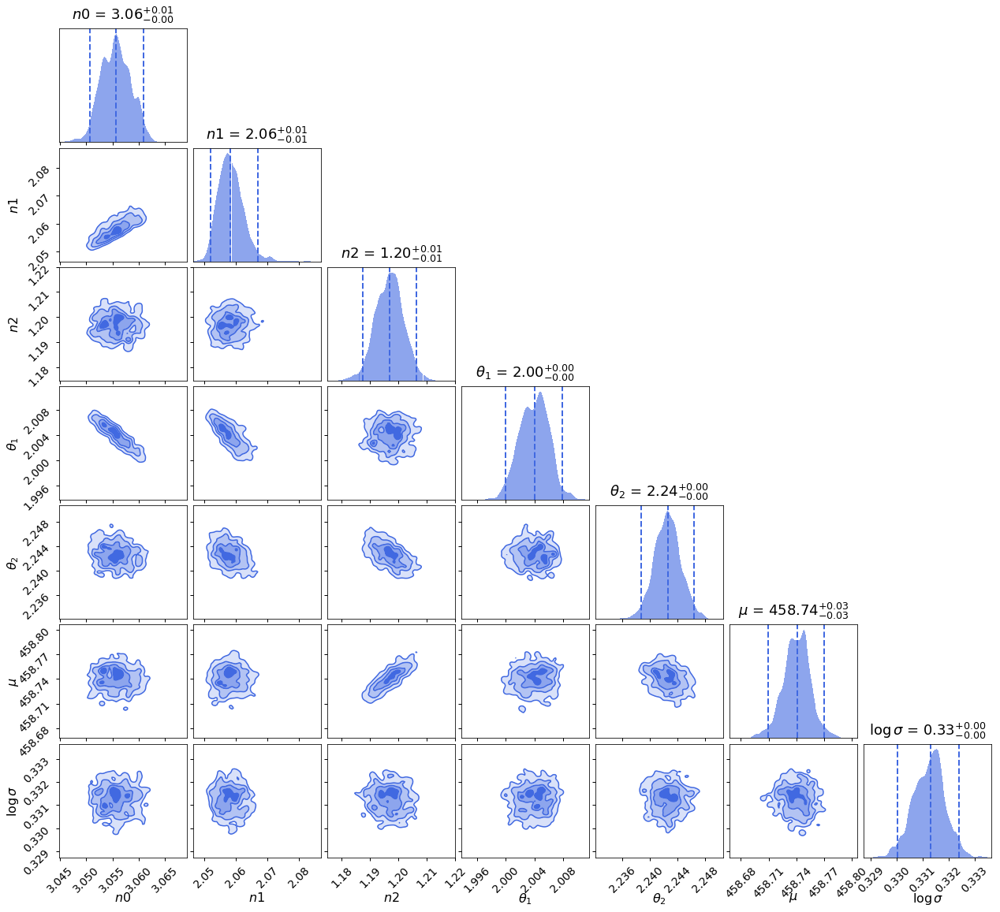

In [91]:
# Run & Plot
############################################
ds_3p = DynamicNestedSampler(loglike_3p, prior_tf_3p, ndim)
ds_3p.run_fitting(nlive_init=50, nlive_batch=15, maxbatch=2)

ds_3p.cornerplot(labels=labels, figsize=(18, 16)) 

Fitting (mean) :  [3.0560e+00 2.0580e+00 1.1970e+00 2.0040e+00 2.2430e+00 4.5874e+02
 3.3100e-01]
Fitting (median) :  [3.05600e+00 2.05800e+00 1.19700e+00 2.00400e+00 2.24300e+00 4.58741e+02
 3.31000e-01]


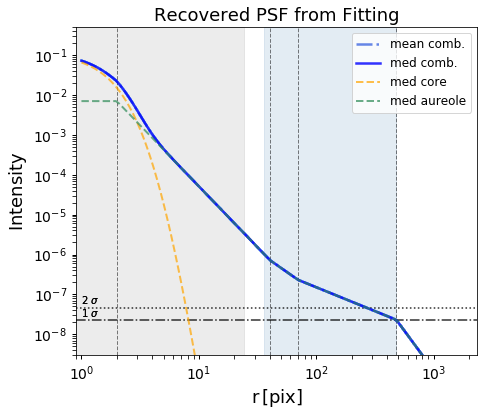

In [93]:
ds_3p.plot_fit_PSF1D(psf, n_bootstrap=500, Amp_max=Amp_m, r_core=r_core_s)

Bakground : 458.74 +/- 2.14
Reduced Chi^2: 2.06239


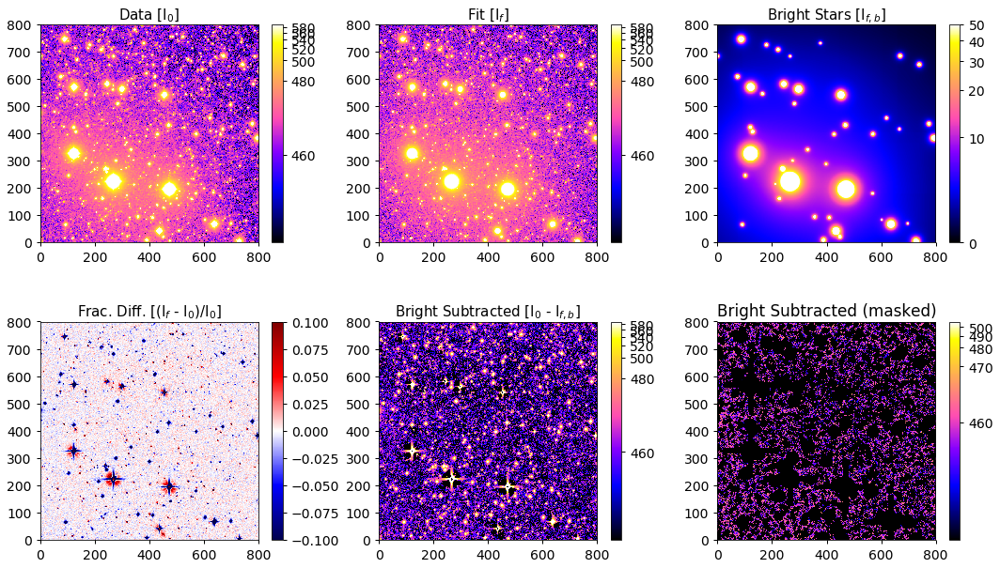

In [109]:
psf_fit, params = make_psf_from_fit(ds_3p.results, psf, n_out=4, theta_out=1200)
image_star, noise_fit, bkg_fit = generate_image_fit(psf_fit, stars0)
image_fit = image_star + image_base + noise_fit + bkg_fit

cal_reduced_chi2((image_fit[~mask_fit]).ravel(), Y, params)
draw_comparison_2D(image_fit, image, mask_fit, image_star, vmin=458, vmax=590)

Bakground : 458.48 +/- 2.13
Reduced Chi^2: 1.11677


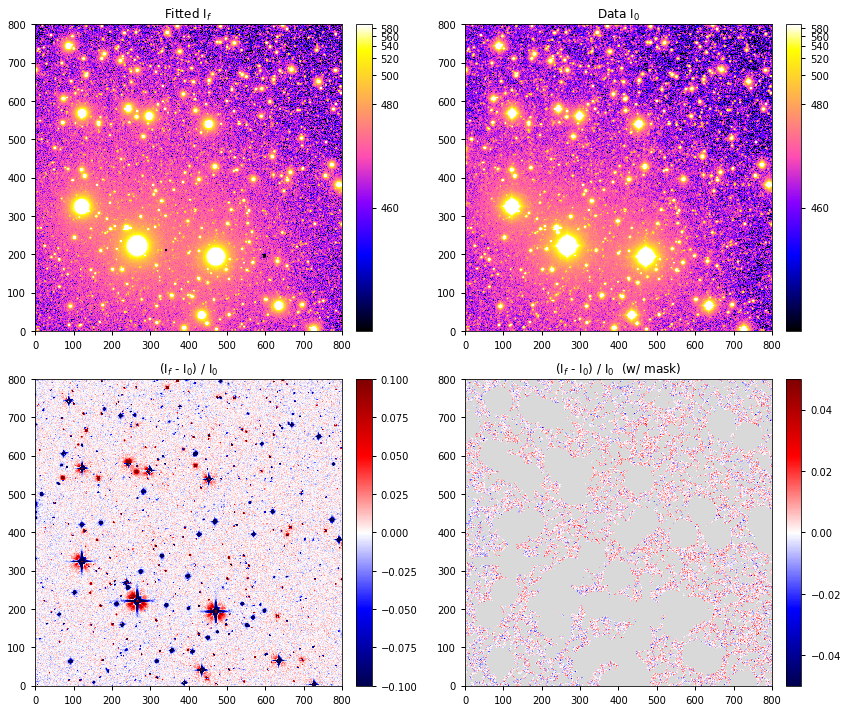

In [30]:
psf_fit, params = make_psf_from_fit(ds_3p.results, psf, n_out=4, theta_out=1200)
image_star, noise_fit, bkg_fit = generate_image_fit(psf_fit, stars0)
image_fit = image_star + image_base + noise_fit + bkg_fit

cal_reduced_chi2((image_fit[~mask_fit]).ravel(), Y, params)
draw_comparison_2D(image_fit, image, mask_fit, image_star, vmin=458, vmax=590)

In [34]:
fit_info = {'method':'3p', 'image_size':image_size,
            'image_bounds0':image_bounds0,
            'r_core':r_core_s, 'r_scale':R_scale}
fname='NGC5907-G-fit_best_X%dY%d_%s_2.res'%(patch_Xmin0, patch_Ymin0, '3p')
ds_3p.save_result(fname, fit_info, dir_name='./real/3p')

### Single Power Law

Run Nested Fitting for the image... Dim of params: 3
Opening pool: # of CPU used: 3


iter: 2236 | batch: 2 | bound: 29 | nc: 2 | ncall: 7458 | eff(%): 29.981 | loglstar: -959135.099 < -959131.950 < -959133.107 | logz: -959148.227 +/-  0.544 | stop:  4.903                            


Finish Fitting! Total time elapsed: 1.21e+03s


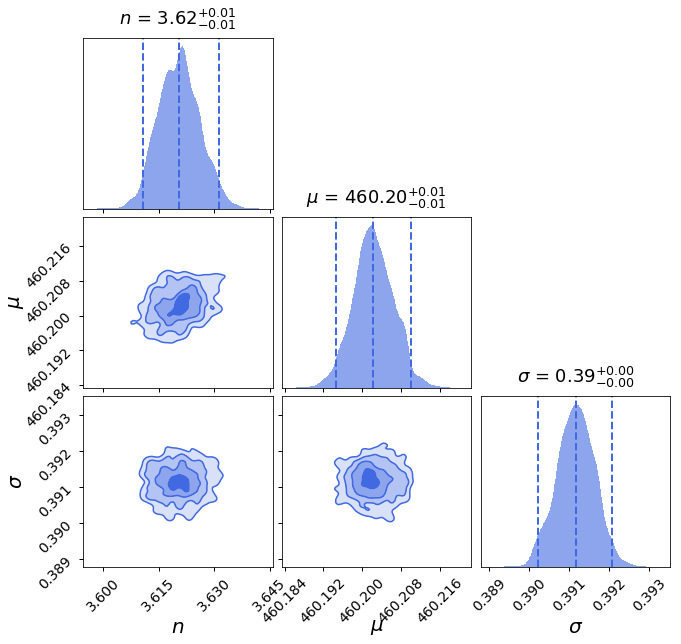

In [43]:
# Run Fitting
pdsampler = Run_Dynamic_Nested_Fitting(loglike, prior_tf, ndim, nlive_init=100, nlive_batch=50)
pdres = pdsampler.results

# Plot Result
fig, axes = dyplot.cornerplot(pdres, labels=labels, 
                              color="royalblue", truth_color="indianred",
                              title_kwargs={'fontsize':18, 'y': 1.04},
                              label_kwargs={'fontsize':20}, show_titles=True, 
                              fig=plt.subplots(ndim, ndim, figsize=(10, 9)))

Bakground : 460.20 +/- 2.46
Reduced Chi^2: 0.99984


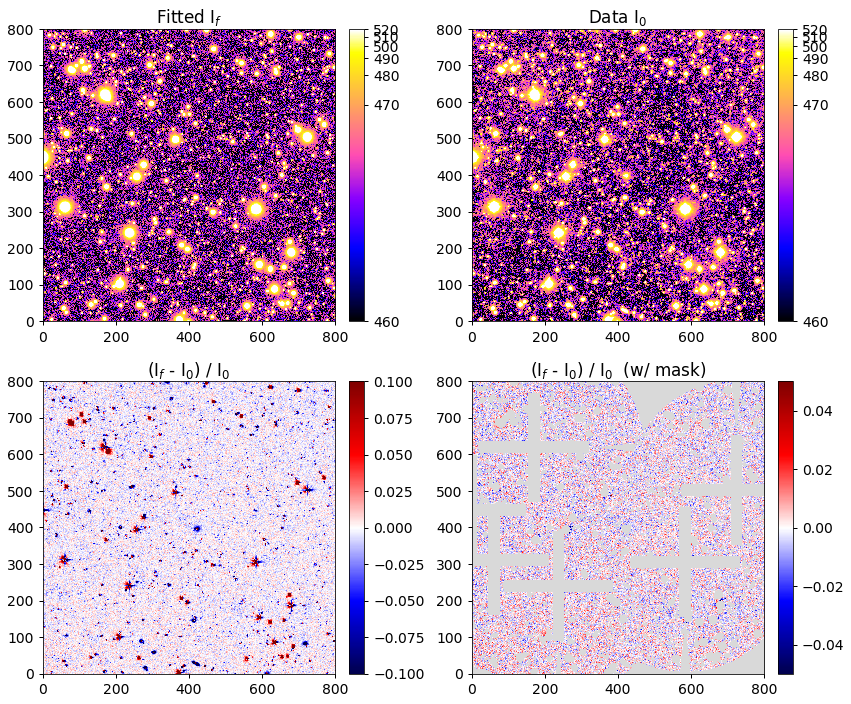

In [44]:
image_fit, noise_fit, pmed = generate_image_fit(pdres, psf, stars0, image_base)
cal_reduced_chi2(image_fit[~mask_fit].ravel(), Y, sigma=10**pmed[-1], n_param=3)
draw_comparison_fit_data(image_fit, image, noise_fit, mask_fit, vmin=460, vmax=520)

In [47]:
save_nested_fitting_result(pdres, filename='./real/NGC5907-G-fit_best_X%dY%d.res'%(patch_Xmin0, patch_Ymin0))

## Historical Results

Fitting (mean):  [ -1.15175395   2.78499813 461.93239078   2.36513342]
Fitting (median):  [ -1.15553728   2.78501443 461.93224525   2.36520676]
2643214.6874619466 1057.661772445025
2641476.6975351567 1057.694568483241


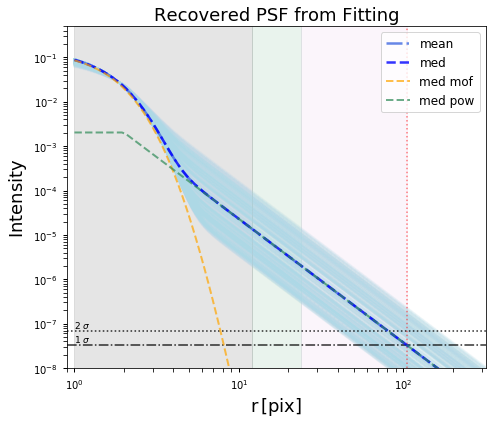

In [42]:
plot_fit_PSF(pdres, n_bootstrap=500, image_size=image_size)

#### Region: [800,800,1800,1800] 
#### Fitted patch: 800 X 800  
#### Dual Mask : S/N = 3   +   $\bf R_{core} = 1\,(0.5)\,arcmin$   +   Gaussian Noise

Run Nested Fitting for the image... Dim of paramas: 4
Opening pool: # of CPU used: 3


iter: 2426 | batch: 2 | bound: 70 | nc: 5 | ncall: 13663 | eff(%): 17.756 | loglstar: -484303.150 < -484300.227 < -484301.503 | logz: -484318.615 +/-  0.576 | stop:  4.146                           


Finish Fitting! Total time elapsed: 1.26e+03s


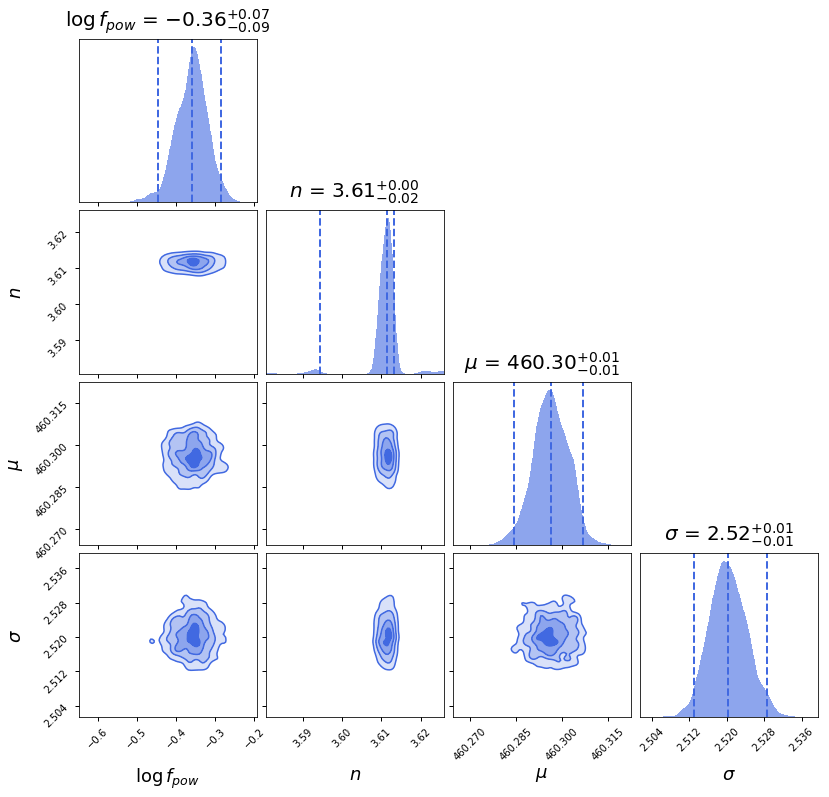

In [30]:
if RUN_FITTING:
    start = time.time()
    pdsampler = Run_Dynamic_Nested_Fitting(loglike, prior_tf, ndim=4, 
                                           nlive_init=100, nlive_batch=50, maxbatch=2)
    end = time.time()
    print("Finish Fitting! Total time elapsed: %.3gs"%(end-start))
    
    pdres = pdsampler.results

    # Plot Result
    fig, axes = dyplot.cornerplot(pdres, show_titles=True, 
                                  color="royalblue", 
                                  labels=labels,
                                  title_kwargs={'fontsize':20, 'y': 1.04}, 
                                  label_kwargs={'fontsize':18},
                                  fig=plt.subplots(4, 4, figsize=(12, 11)))

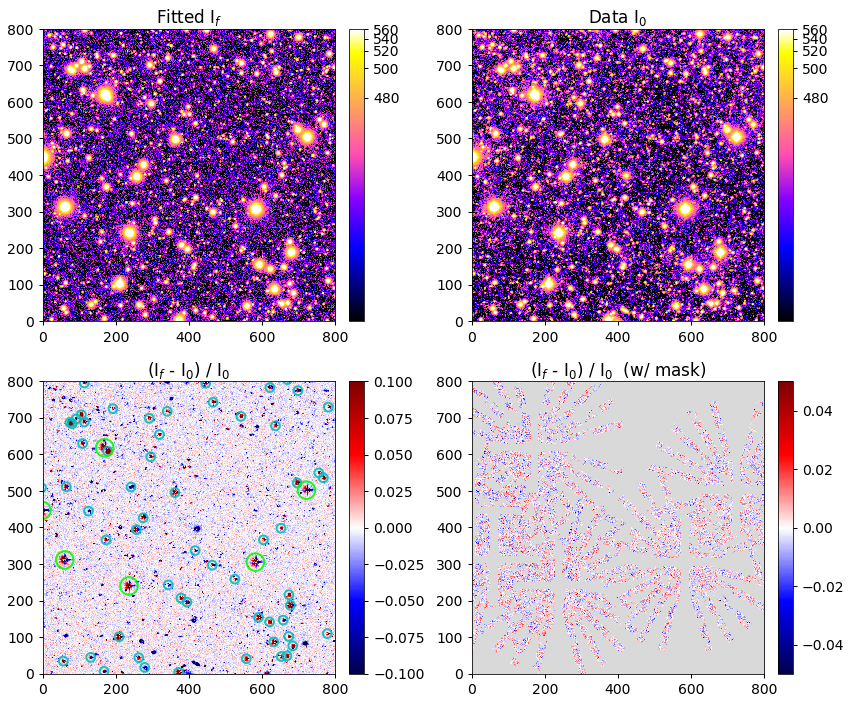

In [230]:
# Difference between real vs conv
pmed, pmean, pcov = get_params_fit(pdres)
logf_fit, n_fit, mu_fit, sigma_fit = pmed

img_fit = generate_image_galsim_scale(frac=10**logf_fit, n=n_fit, mu=mu_fit, 
                                      star_pos=star_pos, scale=z_norm, parallel=True, draw_real = True)
noise_fit = make_noise_image(image_size, sigma_fit**2)
img_fit += noise_fit

fig, ((ax1,ax2), (ax3,ax4)) = plt.subplots(2,2,figsize=(12,10))
im = ax1.imshow(img_fit, vmin=mu_fit, vmax=mu+100, norm=norm1, cmap="gnuplot2")
colorbar(im)
im = ax2.imshow(image, vmin=mu_fit, vmax=mu+100, norm=norm1, cmap="gnuplot2")    
colorbar(im)
diff = (img_fit-image)/image
im = ax3.imshow(diff, vmin=-0.1, vmax=0.1, cmap="seismic")
diff = (img_fit-image)/image
colorbar(im)
aper1.plot(color='c',lw=2,alpha=0.9,axes=ax3)
aper2.plot(color='lime',lw=2,alpha=0.9,axes=ax3)

diff[mask_fit] = np.nan
im = ax4.imshow(diff, vmin=-0.05, vmax=0.05, cmap="seismic")
colorbar(im)

ax1.set_title("Fitted I$_f$")
ax2.set_title("Data I$_0$")
ax3.set_title("(I$_f$ - I$_0$) / I$_0$")
ax4.set_title("(I$_f$ - I$_0$) / I$_0$  (w/ mask)")

plt.tight_layout()
